

```
# Als Code formatiert
```
**Remark:** The following source code and project documentation is only for internal use and shall not be distributed or published.
# Introduction
## Task

*   Detect Man-over-Bord situations on vessels via image classification
*   Task is part of the project *Detecting dangerous situations on vessels*

## Dataset


*   200 GB of videos (ca. 100hrs)
*   Data in a properitary video format
*   Extraction of snapshots from raw data



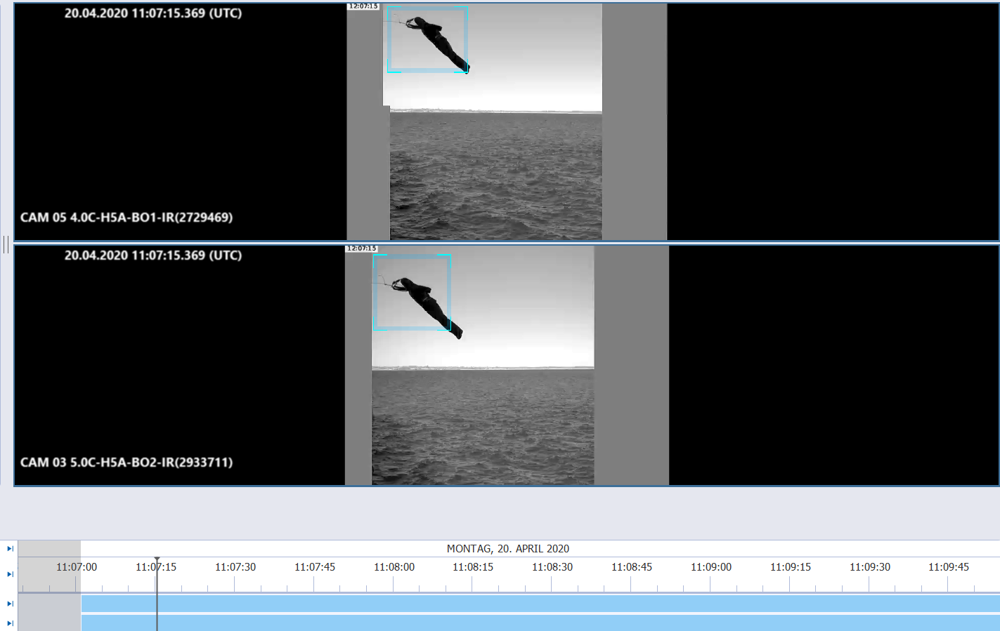





In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Imports

In [ ]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import zipfile
import random
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras import layers, models
from distutils.dir_util import copy_tree
from tensorflow.keras.applications.inception_v3 import InceptionV3

from keras.preprocessing import image
import numpy as np

# Preprocessing

In [ ]:
# extract ZIP-file from google-drive into tmp directory
local_zip = '/content/gdrive/MyDrive/MOB.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

local_zip1 = '/content/gdrive/MyDrive/no_MOB.zip'
zip_ref = zipfile.ZipFile(local_zip1, 'r')
zip_ref.extractall('/tmp')

local_zip2 = '/content/gdrive/MyDrive/test_pics.zip'
zip_ref = zipfile.ZipFile(local_zip2, 'r')
zip_ref.extractall('/tmp')

In [ ]:
# create dataset directory
os.mkdir('/tmp/dataset')
os.mkdir('/tmp/dataset/training')
os.mkdir('/tmp/dataset/validation')

os.mkdir('/tmp/dataset/training/MOB')
os.mkdir('/tmp/dataset/training/no_MOB')

os.mkdir('/tmp/dataset/validation/MOB')
os.mkdir('/tmp/dataset/validation/no_MOB')

In [ ]:
# copy MOB_training in dataset directory
fromDirectory = "/tmp/MOB/MOB_training"
toDirectory = "/tmp/dataset/training/MOB"
copy_tree(fromDirectory, toDirectory)

# copy no_MOB_training in dataset directory
fromDirectory = "/tmp/no_MOB/no_MOB_training"
toDirectory = "/tmp/dataset/training/no_MOB"
copy_tree(fromDirectory, toDirectory)

# copy MOB_validation in dataset directory
fromDirectory = "/tmp/MOB/MOB_validation"
toDirectory = "/tmp/dataset/validation/MOB"
copy_tree(fromDirectory, toDirectory)

# copy no_MOB_validation in dataset directory
fromDirectory = "/tmp/no_MOB/no_MOB_validation"
toDirectory = "/tmp/dataset/validation/no_MOB"
copy_tree(fromDirectory, toDirectory)

['/tmp/dataset/validation/no_MOB/Snapshot-2021-06-24 13.11.26.883.jpg',
 '/tmp/dataset/validation/no_MOB/6512.png',
 '/tmp/dataset/validation/no_MOB/7554.png',
 '/tmp/dataset/validation/no_MOB/8646.png',
 '/tmp/dataset/validation/no_MOB/4332.png',
 '/tmp/dataset/validation/no_MOB/Snapshot-2021-06-24 13.20.58.585.jpg',
 '/tmp/dataset/validation/no_MOB/7601.png',
 '/tmp/dataset/validation/no_MOB/9792.png',
 '/tmp/dataset/validation/no_MOB/9789.png',
 '/tmp/dataset/validation/no_MOB/7561.png',
 '/tmp/dataset/validation/no_MOB/5441.png',
 '/tmp/dataset/validation/no_MOB/8725.png',
 '/tmp/dataset/validation/no_MOB/Snapshot-2021-06-24 13.21.43.428.jpg',
 '/tmp/dataset/validation/no_MOB/5401.png',
 '/tmp/dataset/validation/no_MOB/7619.png',
 '/tmp/dataset/validation/no_MOB/Schnappschuss-2021-06-06 16.26.34.981.jpg',
 '/tmp/dataset/validation/no_MOB/Schnappschuss-2021-06-06 17.20.57.838.jpg',
 '/tmp/dataset/validation/no_MOB/8722.png',
 '/tmp/dataset/validation/no_MOB/9744.png',
 '/tmp/dataset

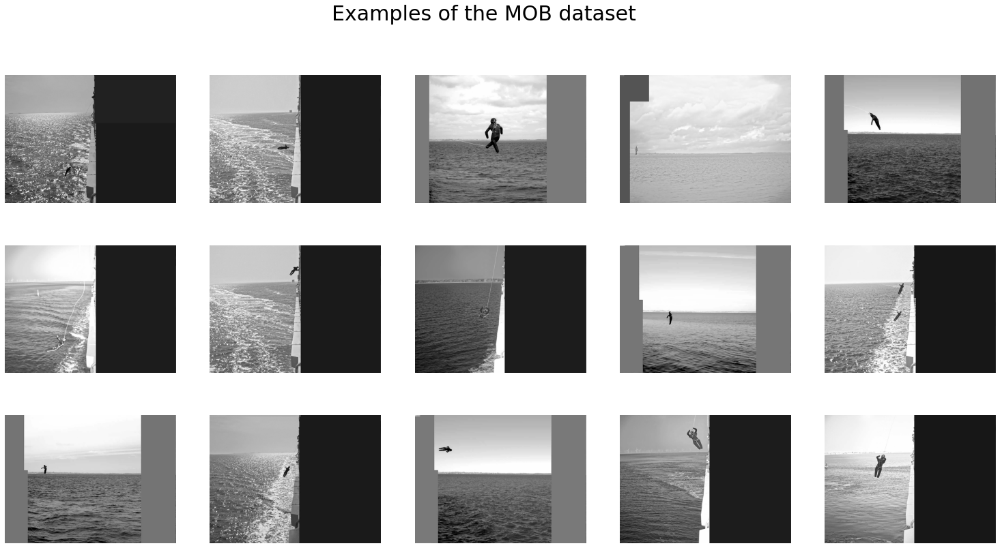

In [ ]:
# Plot example MOB pictures

rows = 3
os.chdir('/tmp/MOB/MOB_training')
files = os.listdir('/tmp/MOB/MOB_training')

r = random.sample(files, 15)
plt.figure(figsize=(26, 13))
for num, x in enumerate(r):
    img = Image.open(x)
    plt.subplot(rows,5,num+1)
    #plt.title(x.split('.')[0])
    plt.axis('off')
    plt.suptitle('Examples of the MOB dataset', size=30)
    plt.imshow(img)

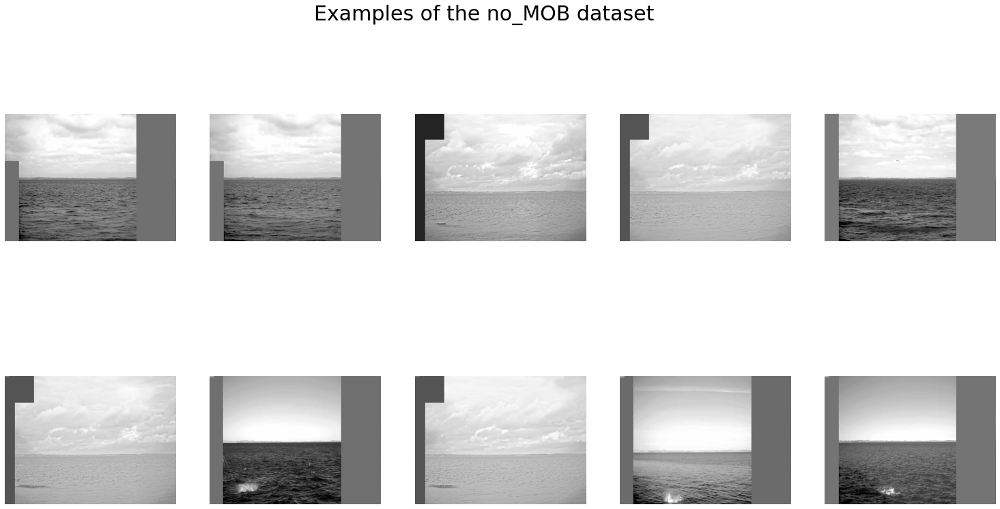

In [ ]:
# Plot example no_MOB pictures

# extract ZIP-file from google-drive into tmp directory
local_zip = '/content/gdrive/MyDrive/no_MOB_example.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

# Plot the pictures

rows = 2
os.chdir('/tmp/no_MOB_example/')
files = os.listdir('/tmp/no_MOB_example/')

plt.figure(figsize=(26, 13))
for num, x in enumerate(files):
    img = Image.open(x)
    plt.subplot(rows,5,num+1)
    plt.axis('off')
    plt.suptitle('Examples of the no_MOB dataset', size=30)
    plt.imshow(img)

## Problems in the dataset


*   Unbalanced dataset
  *   2030 MOB pictures
  *   308 no_MOB pictures


*   Very similar pictures --> Not a lot information in the data
*   No no_MOB objects (i.e. seagull, buoy, sailing boat,...)

##Generation of additional training and validation data
(die folgenden Blöcke müssen nicht ausgeführt werden, da die generierten Bilder schon in unserem Datensatz enthalten sind)


*   Generation of additional no_MOB data by

  *   pasting random objects
  *   with random size
  *   in a random position into one of the existing no_MOB pictures
*   Balancing the data
  *   2030 MOB pictures
  *   2030 no_MOB pictures

In [ ]:
### Preperation for picture generation
## Directions are needed to get the filesnames for the pictures

# creating variables with pathnames to dataset
base_dir = '/tmp/dataset'
train_dir = os.path.join( base_dir, 'training')
validation_dir = os.path.join( base_dir, 'validation')


train_pos_dir = os.path.join(train_dir, 'MOB')
train_neg_dir = os.path.join(train_dir, 'no_MOB') 
validation_pos_dir = os.path.join(validation_dir, 'MOB') 
validation_neg_dir = os.path.join(validation_dir, 'no_MOB')

# Creating lists with all names of the pictures
train_MOB_fnames = os.listdir(train_pos_dir)
train_noMOB_fnames = os.listdir(train_neg_dir)
validation_MOB_fnames = os.listdir(validation_pos_dir)
validation_noMOB_fnames = os.listdir(validation_neg_dir)

print("Number of pictures in the directory:")
print("{}  train_alarm".format(len(train_MOB_fnames)))
print("{}  train_non_alarm".format(len(train_noMOB_fnames)))
print("{}  total training data".format(len(train_MOB_fnames) + len(train_noMOB_fnames)))
print()
print("{}  validation_alarm".format(len(validation_MOB_fnames)))
print("{}  validation_non_alarm".format(len(validation_noMOB_fnames)))
print("{}  total validation data".format(len(validation_MOB_fnames) + len(validation_noMOB_fnames)))

Number of pictures in the directory:
1421  train_alarm
1421  train_non_alarm
2842  total training data

609  validation_alarm
609  validation_non_alarm
1218  total validation data


In [ ]:
training_size = len(train_MOB_fnames) + len(train_noMOB_fnames)

In [ ]:
### Generate additional no_MOB pictures for training data

imagesize = (500, 500)
# Picture, with objects to paste into the background (example_pics)
example_pics_fnames = os.listdir('/tmp/example_pics')
path, dirs, files = next(os.walk("/tmp/example_pics"))
# Number of pictures in example_pics
no_example = len(files)

# Number of background pictures
path, dirs, files = next(os.walk(base_dir + "/training/no_MOB_training/"))
no_img = len(files)

index = 0
k = 0
while no_img <= 1421:
  k += 1
  for i in train_neg_fnames:
    imagesize1 = (25+randrange(25), 25+randrange(25))
    index += 1

    # open the image
    Image1 = Image.open(base_dir + '/training/no_MOB_training/' + i)
    # resize image
    Image1 = Image1.resize(imagesize)
    Image2 = Image.open('/tmp/example_pics/' + example_pics_fnames[randrange(no_example)])
    size = randrange(25, 350)
    Image2 = Image2.resize((size, size))

    # paste image giving dimensions
    new_img = Image.new('RGBA', Image1.size, (0, 0, 0, 0))
    new_img.paste(Image1)
    new_img.paste(Image2, (randrange(420), randrange(420)), mask=Image2)
    display(new_img)

    # save the image
    new_img.save(base_dir + '/training/no_MOB_training/%s%s.png' % (k, index))
    path, dirs, files = next(os.walk(base_dir + "/training/no_MOB_training/"))
    no_img = len(files)

### Pictures to generate the additional data
*   Loading the pictures to be pasted  from google-drive. 
*   Plotting the pictures.

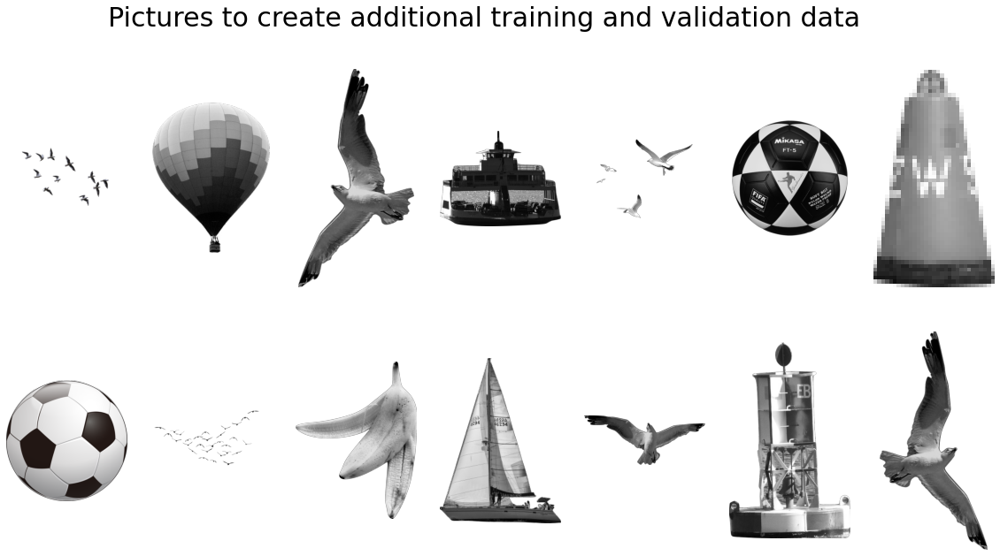

In [ ]:
# extract ZIP-file with pictures to be paste into the background from google-drive into tmp directory
local_zip = '/content/gdrive/MyDrive/example_pics.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

# Plot the pictures

rows = 2
os.chdir('/tmp/example_pics/')
files = os.listdir('/tmp/example_pics/')

plt.figure(figsize=(20, 10))
for num, x in enumerate(files):
    img = Image.open(x)
    plt.subplot(rows,7,num+1)
    plt.axis('off')
    plt.suptitle('Pictures to create additional training and validation data', size=30)
    plt.imshow(img)

### Generate the additional no_MOB training data


*   Done with the Python PIL library
*   Pictures pasted with size betwwen 25 and 350 pixels
*   Pictures pasted in a position between 0 and 420 in the background picture
*   Procedure is repeated until enough pictures are created to equalize the dataset





In [ ]:
### Generate additional no_MOB pictures for training data

imagesize = (500, 500)
# Picture, with objects to paste into the background (example_pics)
example_pics_fnames = os.listdir('/tmp/example_pics')
path, dirs, files = next(os.walk("/tmp/example_pics"))
# Number of pictures in example_pics
no_example = len(files)

# Number of background pictures
path, dirs, files = next(os.walk(base_dir + "/training/no_MOB/"))
no_img = len(files)

index = 0
k = 0
while no_img <= 1421:
  k += 1
  for i in train_noMOB_fnames:
    imagesize1 = (25+randrange(25), 25+randrange(25))
    index += 1

    # open the image
    Image1 = Image.open(base_dir + '/training/no_MOB/' + i)
    # resize image
    Image1 = Image1.resize(imagesize)
    Image2 = Image.open('/tmp/example_pics/' + example_pics_fnames[randrange(no_example)])
    size = randrange(25, 350)
    Image2 = Image2.resize((size, size))

    # paste image giving dimensions
    new_img = Image.new('RGBA', Image1.size, (0, 0, 0, 0))
    new_img.paste(Image1)
    new_img.paste(Image2, (randrange(420), randrange(420)), mask=Image2)
    #display(new_img)

    # save the image
    #new_img.save(base_dir + '/training/no_MOB/%s%s.png' % (k, index))
    path, dirs, files = next(os.walk(base_dir + "/training/no_MOB/"))
    no_img = len(files)

Plotting random example pictures of the no_MOB training dataset including original and generated pictures.

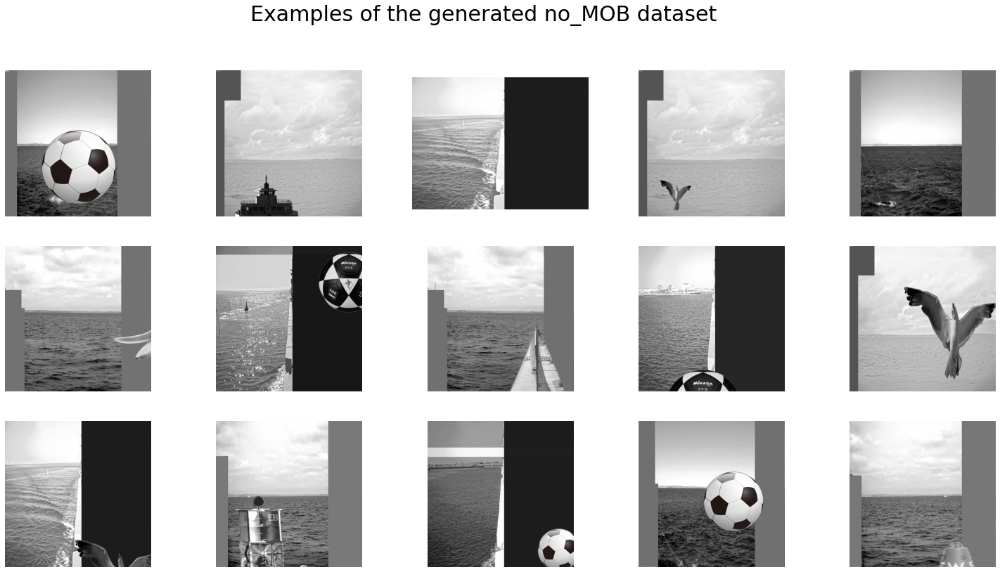

In [ ]:
# Plot the generated no_MOB pictures

rows = 3
os.chdir('/tmp/dataset/training/no_MOB/')
files = os.listdir('/tmp/dataset/training/no_MOB/')

r = random.sample(files, 15)
plt.figure(figsize=(26, 13))
for num, x in enumerate(r):
    img = Image.open(x)
    plt.subplot(rows,5,num+1)
    #plt.title(x.split('.')[0])
    plt.axis('off')
    plt.suptitle('Examples of the generated no_MOB dataset', size=30)
    plt.imshow(img)

### Generate the additional no_MOB validation data

In [ ]:
### Generate additional no_MOB pictures for validation data

imagesize = (500, 500)
# Picture, with objects to paste into the background (example_pics)
example_pics_fnames = os.listdir('/tmp/example_pics')
path, dirs, files = next(os.walk("/tmp/example_pics"))
# Number of pictures in example_pics
no_example = len(files)

# Number of background pictures
path, dirs, files = next(os.walk(base_dir + "/validation/no_MOB/"))
no_img = len(files)

index = 0
k = 0
while no_img <= 609:
  k += 1
  for i in train_neg_fnames:
    imagesize1 = (25+randrange(25), 25+randrange(25))
    index += 1

    # open the image
    Image1 = Image.open(base_dir + '/validation/no_MOB/' + i)
    # resize image
    Image1 = Image1.resize(imagesize)
    Image2 = Image.open('/tmp/example_pics/' + example_pics_fnames[randrange(no_example)])
    size = randrange(25, 350)
    Image2 = Image2.resize((size, size))

    # paste image giving dimensions
    new_img = Image.new('RGBA', Image1.size, (0, 0, 0, 0))
    new_img.paste(Image1)
    new_img.paste(Image2, (randrange(420), randrange(420)), mask=Image2)
    #display(new_img)

    # save the image
    #new_img.save(base_dir + '/validation/no_MOB/%s%s.png' % (k, index))
    path, dirs, files = next(os.walk(base_dir + "/validation/no_MOB/"))
    no_img = len(files)

# Augmentation

Pitching and Rolling of the vessel is simulated by a random rotation of the pictures between 0° and 20°

In [ ]:
def image_generator_hf(imagesize, batchsize):
  train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 20,
                                   vertical_flip = True)

  test_datagen = ImageDataGenerator(rescale = 1./255.)


  # Flow training images in batches of 50 using train_datagen generator
  train_generator = train_datagen.flow_from_directory(train_dir,
                                                    shuffle=True,
                                                    batch_size = batchsize,
                                                    class_mode = 'binary',
                                                    target_size = (imagesize, imagesize))     

  # Flow validation images in batches of 50 using test_datagen generator
  validation_generator =  test_datagen.flow_from_directory(validation_dir,
                                                         shuffle=True,
                                                         batch_size  = batchsize,
                                                         class_mode  = 'binary',
                                                         target_size = (imagesize, imagesize))
  return train_generator, validation_generator

In [ ]:
imagesize = 250
batchsize = 50
training_size = len(train_MOB_fnames) + len(train_noMOB_fnames)
validation_size = len(validation_MOB_fnames) + len(validation_noMOB_fnames)


train_generator, validation_generator = image_generator_hf(imagesize, batchsize)

Found 2842 images belonging to 2 classes.
Found 1218 images belonging to 2 classes.


# Baseline - Model
Inception-v3 as baseline model 

Convolutional neural network 

In [ ]:
base_model = InceptionV3(input_shape = (imagesize, imagesize, 3),
                         include_top = False,
                         weights = 'imagenet')

for layer in base_model.layers:
    layer.trainable = False

In [ ]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.models.Model(base_model.input, x)

model.compile(optimizer = RMSprop(learning_rate=0.001),
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])



*   Changed the class weights of the loss function to increase the accuracy of class MOB

*   Losses are multiplied by the class weights





In [ ]:
callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/content/gdrive/MyDrive/final_models/test/CNN_3C_BC_A_40E_IG_GradCAM(3,3).h5', verbose=1, save_best_only=True),     
        tf.keras.callbacks.EarlyStopping(patience=30, monitor='loss'),
        #tf.keras.callbacks.TensorBoard(log_dir='logs')
       ]

history = model.fit(train_generator,
                    validation_data = validation_generator,
                    steps_per_epoch = (training_size / batch_size),
                    validation_steps = (validation_size / batch_size),
                    callback = callbacks,
                    class_weight = {0:1.2, 1:1}
                    epochs = 40)

## Accuracy and Loss of the baseline-model

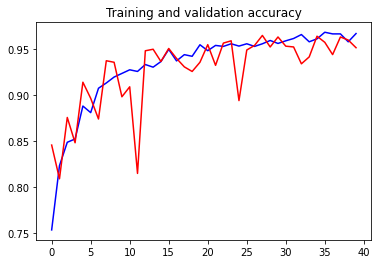

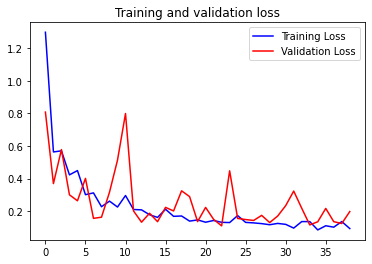

## Predictions


In [ ]:
def load_model(path):
  model = tf.keras.models.load_model('/content/gdrive/MyDrive/final_models/'+ path)
  return model

In [ ]:
model_path = ['baseline_model_2606_S250_E40_.h5']
model = load_model(model_path[0])

In [ ]:
results = model.evaluate(validation_generator, batch_size = batchsize )

25/25 [==============================] - 74s 2s/step - loss: 0.1984 - accuracy: 0.9507


In [ ]:
from tensorflow import keras
# Helperfunction in order to display the predictions
def predict_images(num_images, img_size, classes = True, train_val = True, test_img = False, number_of_columns = 4):
  if test_img == False:
    if classes == True and train_val == True:
      path = (os.getcwd()) + '/training/MOB'
      string = "MOB images coming from the training data"
      #print("MOB images coming from the training data")
    elif classes == True and train_val == False:
      path = (os.getcwd()) + '/validation/MOB'
      string = "MOB images coming from the validation data"
    elif classes == False and train_val == True:
      path = (os.getcwd()) + '/training/no_MOB'
      string = "No MOB images coming from the training data"
    elif classes == False and train_val == False:
      path = (os.getcwd()) + '/validation/no_MOB'
      string = "No MOB images coming from the validation data"
  elif test_img == True:  
    path = '/tmp/test_pics'
    string = "Test data"
  i = 1
  figure = plt.figure(figsize=(30,30))
  for file in random.choices(os.listdir(path), k=num_images):
    #Number of raw for the visualisation
    row_count = (num_images // number_of_columns) + 2
    #Raw Imag
    im = image.load_img(path + '/' + str(file), target_size = img_size)
    img_path = path + '/' + str(file)
    img_array = keras.applications.xception.preprocess_input(get_img_array(img_path, size=img_size))
    #Prediction
    classes = model.predict(img_array)

    #Visualisation of the image
    plt.suptitle(string , size=30)
    plt.subplot(row_count,number_of_columns,i), plt.imshow(im)
    plt.title(f"Raw Image I Prediction: {classes}"), plt.axis('off')
    i = i+1
  i = 1

def get_img_array(img_path, size):
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    array = np.expand_dims(array, axis=0)
    return array


###Training Data

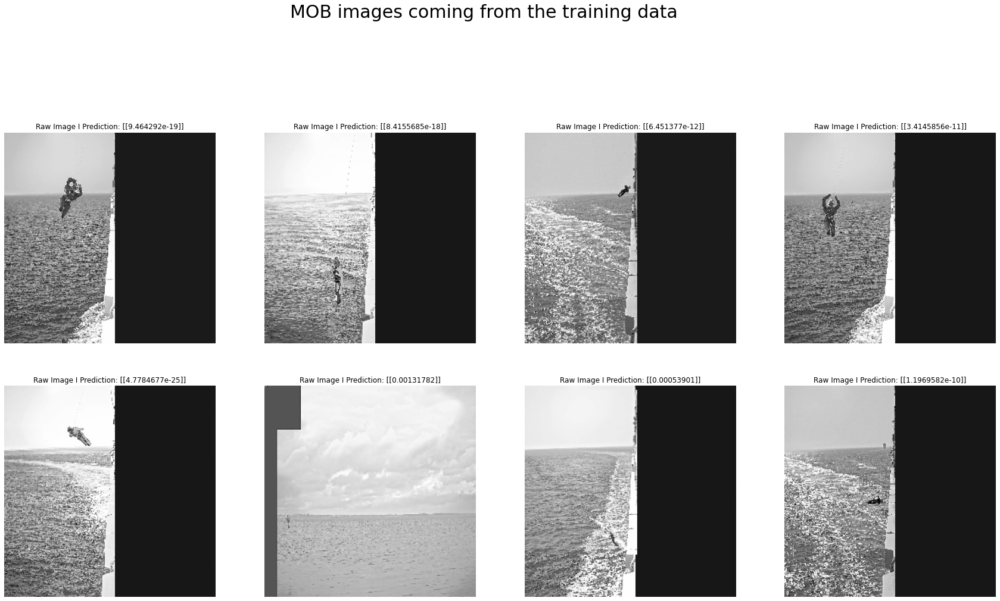

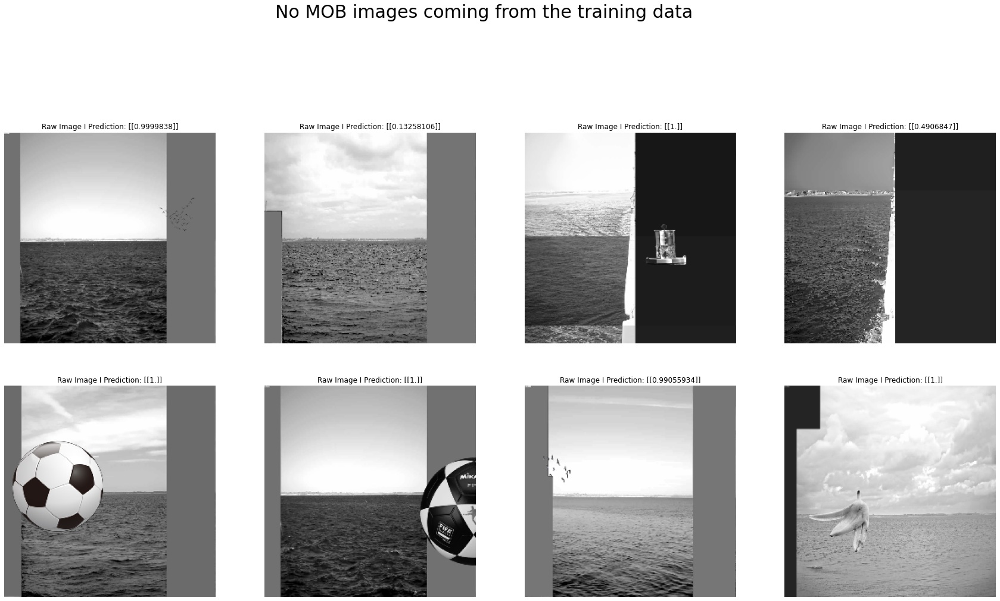

In [ ]:
os.chdir('/tmp/dataset')
img_size = (250, 250)
predict_images(8, img_size, True, True, False)
predict_images(8, img_size, False, True, False)

###Validation Data

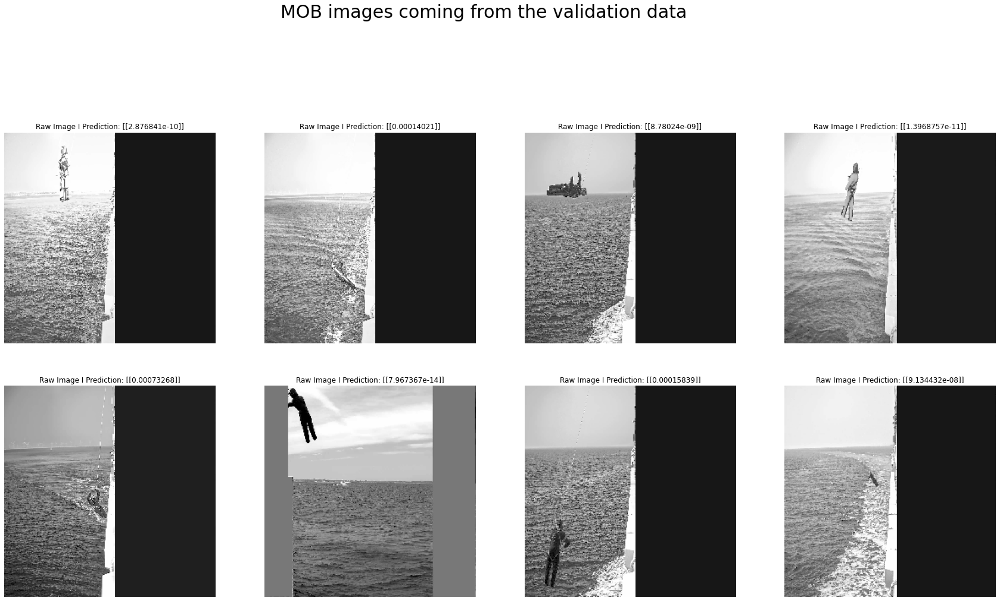

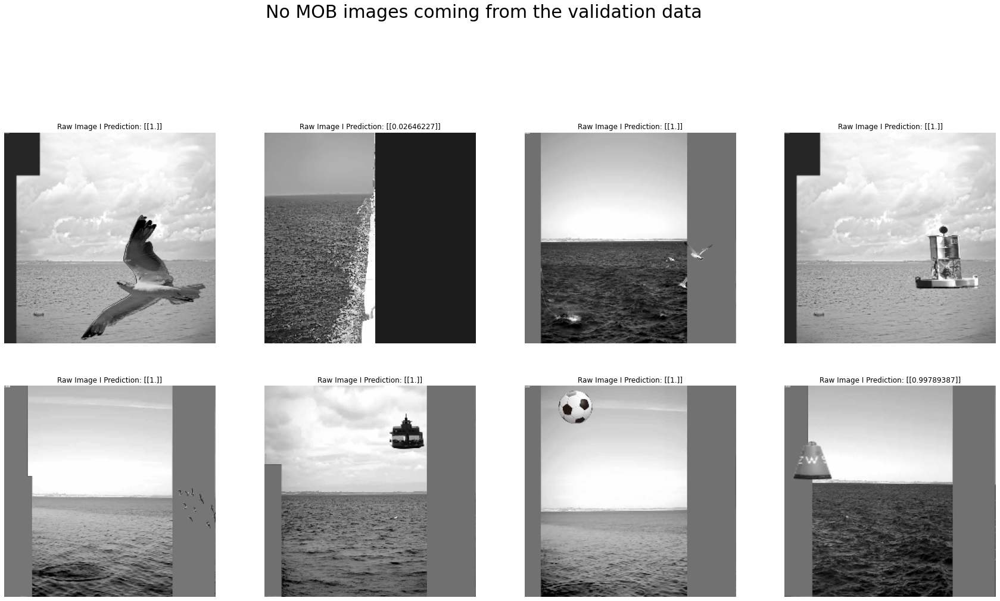

In [ ]:
predict_images(8, img_size, True, False)
predict_images(8, img_size, False, False)

## Visualisation Baseline-Model

### GradCAM Setup

https://keras.io/examples/vision/grad_cam/

In [ ]:
from tensorflow import keras

from IPython.display import Image, display
import matplotlib.cm as cm

In [ ]:
def get_img_array(img_path, size):
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    #superimposed_img.save(cam_path)
    return (superimposed_img)
    # Display Grad CAM
    #display(Image(cam_path))

In [ ]:
os.chdir('/tmp/dataset')

#layer_names=[layer.name for layer in model.layers]
#last_conv_layer_name = str(layer_names[:-3][-1:][0])

def predict_images_GradCAM(num_images, img_size, last_conv_layer_name, classes = True, train_val = True, test_img = False, random_img = True, number_of_columns = 4):
  if test_img == False:
    if classes == True and train_val == True:
      path = (os.getcwd()) + '/training/MOB'
      string = "MOB images coming from the validation data"
      #print("MOB images coming from the training data")
    elif classes == True and train_val == False:
      path = (os.getcwd()) + '/validation/MOB'
      string = "MOB images coming from the validation data"
    elif classes == False and train_val == True:
      path = (os.getcwd()) + '/training/no_MOB'
      string = "No MOB images coming from the training data"
    elif classes == False and train_val == False:
      path = (os.getcwd()) + '/validation/no_MOB'
      string = "No MOB images coming from the validation data"
  elif test_img == True:  
    path = '/tmp/test_pics'
    string = "Test data"

  if random_img == True:
    i = 1
    figure = plt.figure(figsize=(30,30))
    for file in random.choices(os.listdir(path), k=num_images):
      #Number of raw for the visualisation
      row_count = (num_images // number_of_columns) + 2

      # Prepare image
      img_path = path + '/' + str(file)
      img_array = keras.applications.xception.preprocess_input(get_img_array(img_path, size=img_size))

      # Class prediction
      classes = model.predict(img_array)
      #print(preds)

      # Generate class activation heatmap 
      heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
      GradCAM = save_and_display_gradcam(img_path, heatmap)
    
      #Visualisation of the image
      plt.suptitle(string , size=30)
      plt.subplot(row_count,number_of_columns,i), plt.imshow(GradCAM)
      plt.title(f"GradCAM I Predition: {classes}"), plt.axis('off')
      i = i+1
    i = 1
    #for i in range

  
  # Der Teil ist für mich noch offen, ob ich hier den Code noch an laufen bekomme
  else:
    i = 1
    for ii in range(num_images):
      test = os.listdir(path)
      rn = random.randrange(0, len(train_MOB_fnames))
      print(test[rn+ii])
            #Number of raw for the visualisation
      row_count = (num_images // number_of_columns) + 2

      # Prepare image
      img_path = path + '/' + str(test[ii])
      img_array = keras.applications.xception.preprocess_input(get_img_array(img_path, size=img_size))

      # Class prediction
      classes = model.predict(img_array)
      #print(preds)

      # Generate class activation heatmap 
      heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
      GradCAM = save_and_display_gradcam(img_path, heatmap)
    
      #Visualisation of the image
      plt.suptitle(string , size=30)
      plt.subplot(row_count,number_of_columns,i), plt.imshow(GradCAM)
      plt.title(f"GradCAM I Predition: {classes}"), plt.axis('off')
      i = i+1
    i = 1
    print("Test")

###Examples

baseline_model_2606_S250_E40_.h5
conv2d_93


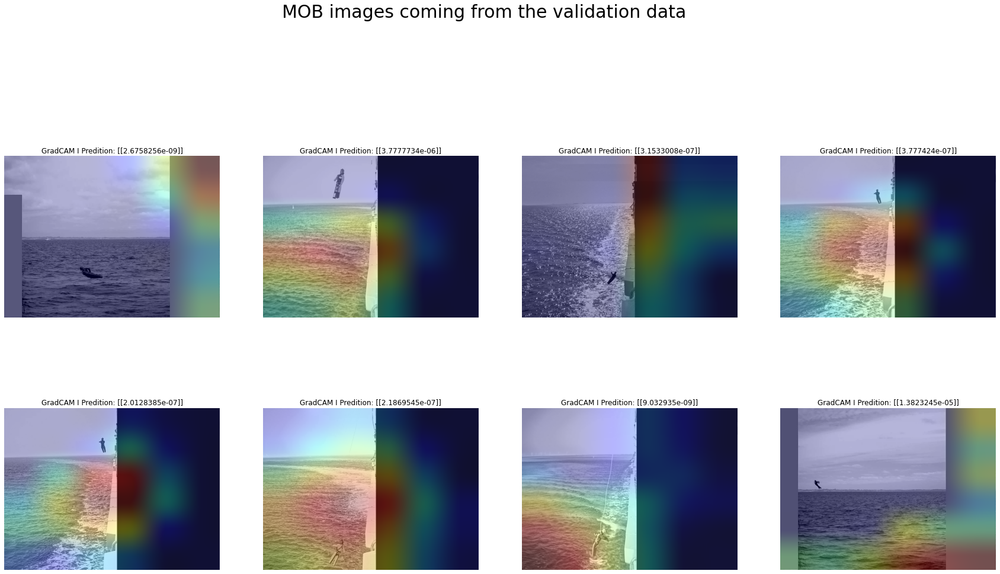

In [ ]:
img_size = (250, 250)
model_test = 0
model = load_model(model_path[model_test])
print(model_path[model_test])
last_conv_layer_name = 'conv2d_93'
print(last_conv_layer_name)

predict_images_GradCAM(8, img_size, last_conv_layer_name, True, True, False)

# CNN - Model

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(500, 500, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(200, activation='relu'))
model.add(layers.Dense(1,activation='sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 498, 498, 64)      1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 249, 249, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 247, 247, 128)     73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 123, 123, 128)     0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 121, 121, 128)     147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 60, 60, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 58, 58, 128)       1

In [ ]:
imagesize = 500
batchsize = 50
training_size = len(train_MOB_fnames) + len(train_noMOB_fnames)
validation_size = len(validation_MOB_fnames) + len(validation_noMOB_fnames)


train_generator, validation_generator = image_generator_hf(imagesize, batchsize)

Found 2842 images belonging to 2 classes.
Found 1218 images belonging to 2 classes.


In [ ]:
model.compile(optimizer= RMSprop(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/content/gdrive/MyDrive/CNN_3C_BC_A_40E_IG_GradCAM(27,27).h5', verbose=1, save_best_only=True),     
        tf.keras.callbacks.EarlyStopping(patience=15, monitor='loss'),
        #tf.keras.callbacks.TensorBoard(log_dir='logs')
       ]

history = model.fit_generator(train_generator,
                              validation_data = validation_generator,
                              steps_per_epoch = (training_size / batchsize),
                              epochs = 40,
                              validation_steps = (validation_size / batchsize),
                              verbose = 1,
                              callbacks = callbacks)

## Predictions


In [ ]:
def load_model(path):
  model = tf.keras.models.load_model('/content/gdrive/MyDrive/final_models/test/'+ path)
  return model

model_path = ['CNN_3C_BC_A_40E_IG_GradCAM(27,27).h5',]
#'CNN_3C_BC_A_40E_IG_GradCAM(3,3).h5'

In [ ]:
for i in range(len(model_path)):
  model = load_model(model_path[i])
  print(model_path[i])
  results = model.evaluate(validation_generator, batch_size = batchsize )
  print("test loss, test a.:", results)

###Training Data

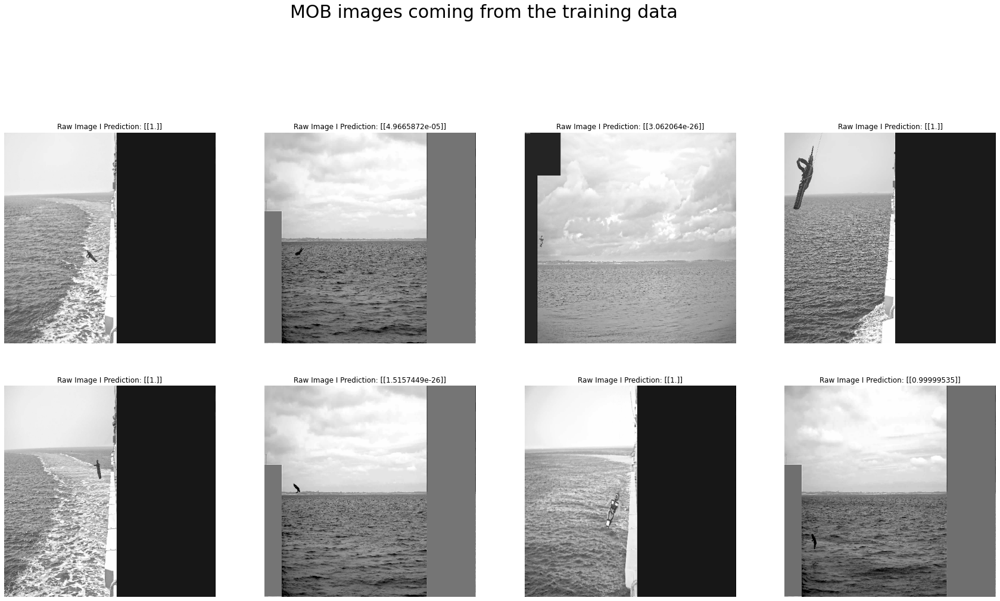

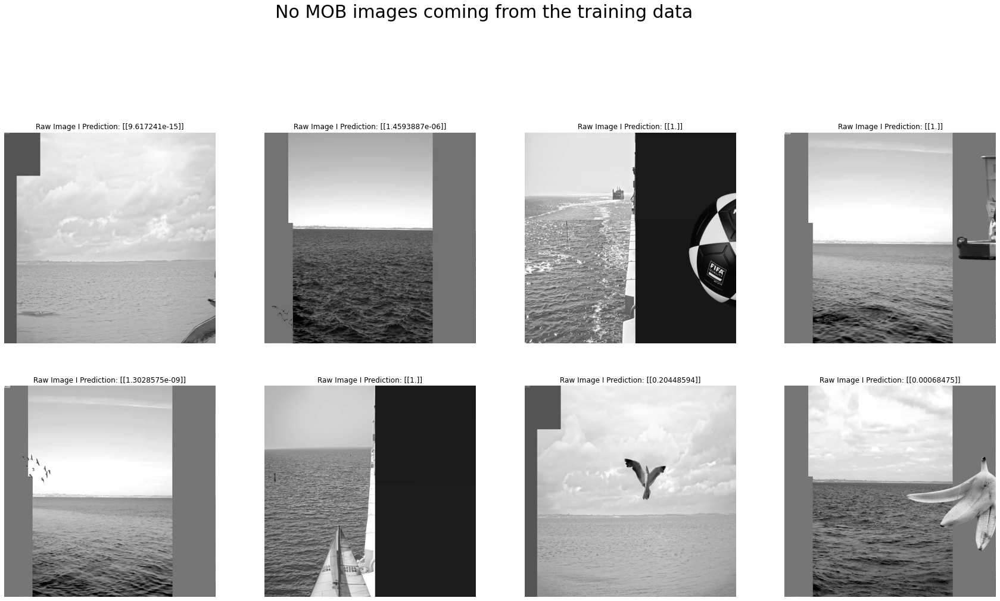

In [ ]:
os.chdir('/tmp/dataset')
model_test = 0
model = load_model(model_path[model_test])
img_size = (500, 500)
predict_images(8, img_size, True, True)
predict_images(8, img_size, False, True)

###Validation Data

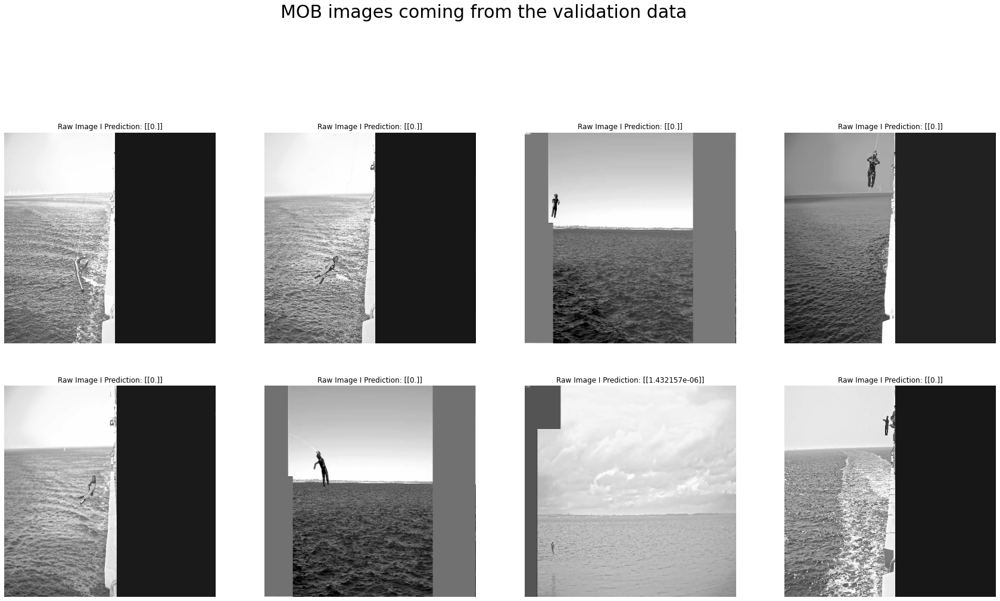

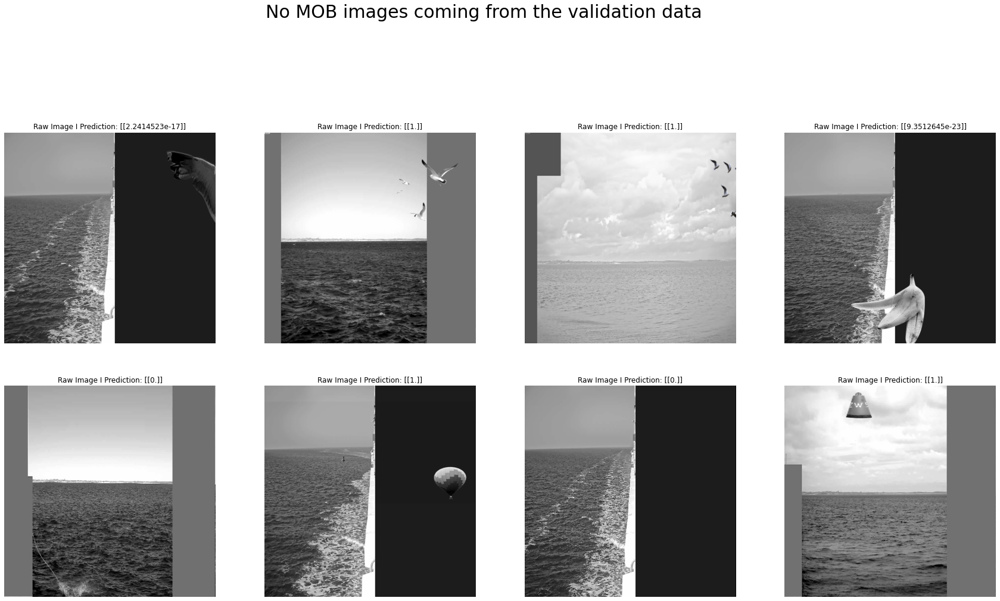

In [ ]:
img_size = (500, 500)
predict_images(8, img_size, True, False)
predict_images(8, img_size, False, False)

##Visualisation CNN Model

###GradCAM

CNN_3C_BC_A_40E_IG_GradCAM(27,27).h5
conv2d_4


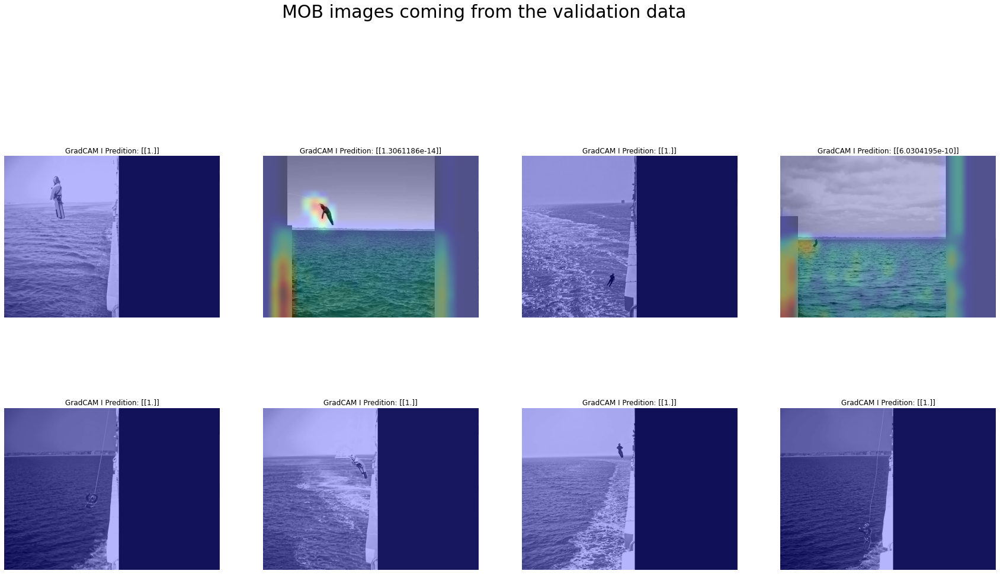

In [ ]:
os.chdir('/tmp/dataset')
img_size = (500, 500)
model_test = 0
model = load_model(model_path[model_test])
print(model_path[model_test])
layer_names=[layer.name for layer in model.layers]
last_conv_layer_name = str(layer_names[:-3][-1:][0])
print(last_conv_layer_name)

predict_images_GradCAM(8, img_size, last_conv_layer_name, True, True, False)

# Evaluation
*In dem Kapitel könnten wir das Evaluieren beider Modelle machen. Also die Confusion Matrix mit der Accuracy pro Klasse die Heatmap und die Vorhersage der Testdaten(Bilder mit echten fallenden Menschen)*
Evaluate the result of the model


*   Show incorrect classified pictures



*   Calculate the confusion matrix
*   Calculate precision and recall for class MOB


*   Calculate the probability to detect a MOB
*   Calculate the probability of a false alarm




In [ ]:
def load_model(path):
  model = tf.keras.models.load_model('/content/gdrive/MyDrive/final_models/'+ path)
  return model

In [ ]:
imagesize = 250
batchsize = 50
training_size = len(train_MOB_fnames) + len(train_noMOB_fnames)
validation_size = len(validation_MOB_fnames) + len(validation_noMOB_fnames)


train_generator, validation_generator = image_generator_hf(imagesize, batchsize)

Found 2842 images belonging to 2 classes.
Found 1218 images belonging to 2 classes.


In [ ]:
model_path = ['baseline_model_classweight).h5']
model = load_model(model_path[0])
results = model.evaluate(validation_generator, batch_size= batchsize)

25/25 [==============================] - 43s 2s/step - loss: 0.1065 - accuracy: 0.9614


In [ ]:
import numpy as np

def Evaluation(image_generator, steps, threshold = 0.5, show = False):
  """ returns Confusion Matrix, normalized confusion Matrix, Precision, Recall and F1 Score for image_generator=data and steps=steps_per_epoch for a binary classifier.
  Set threshold = threshold between class 0 and class 1 (default threshold = 0.5)
  Set show = True to print the false classified pictures """
  confusion_all = np.array([[0,0], [0,0]])
  for step in range(steps):
    X, y = image_generator.next()
    prediction = model.predict(X)
    prediction_all = prediction

    for i in range(0, len(prediction)):
      #print(prediction[i])

      if prediction[i] <= threshold:
        prediction_all[i] = 0
      else:
        prediction_all[i] = 1
        
      if show == True:
        if prediction_all[i] != y[i]:
          plt.imshow(X[i])
          plt.axis('off')
          plt.show()
          if y[i] == 0:
            print("Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB:", prediction[i])
          else:
            print("Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB:", prediction[i])

    confusion = tf.math.confusion_matrix(labels=y, predictions=prediction_all, num_classes=2)
    confusion = np.array(confusion)
    confusion_all = confusion_all + confusion

  print("Confusion Matrix (absolute)\n", np.around(confusion_all, 2))

  #normalised confusion matrix
  sum_of_rows = confusion_all.sum(axis=1)
  confusion_n = confusion_all / sum_of_rows[:, np.newaxis]
  print("Confusion Matrix (normalized)\n", np.around(confusion_n  ,2) )

  # Precision of class 1
  precision = confusion_all[1,1]/(confusion_all[1,0]+confusion_all[1,1])
  print("Precision = ", round(precision,2), "%")
  # Recall of class 1
  recall = confusion_all[1,1]/(confusion_all[0,1]+confusion_all[1,1])
  print("Recall = ", round(recall,2), "%")
  # F1 Score
  F1 = pow((1/precision + 1/recall)/2, (-1))
  print("F1 Score = ", round(F1,2), "%")

  print("\n\n Probability to detect a MOB:", round(recall,2), "%")
  print("\n Probability of a false alarm:", round((1-precision),2), "%")

In [ ]:
Evaluation(train_generator, 25)

Confusion Matrix (absolute)
 [[605  10]
 [ 33 602]]
Confusion Matrix (normalized)
 [[0.98 0.02]
 [0.05 0.95]]
Precision =  0.95 %
Recall =  0.98 %
F1 Score =  0.97 %


 Probability to detect a MOB: 0.98 %

 Probability of a false alarm: 0.05 %


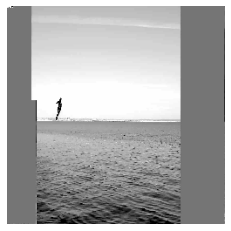

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


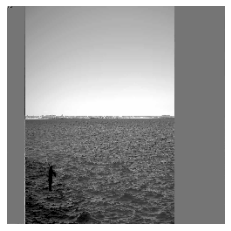

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


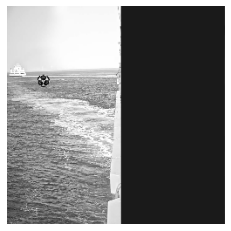

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


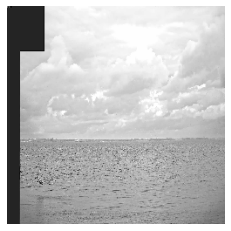

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


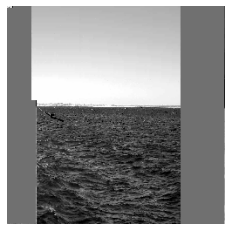

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


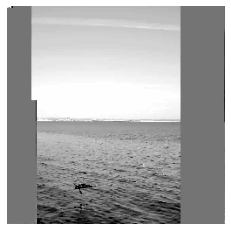

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


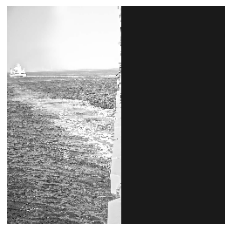

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


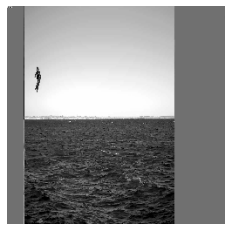

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


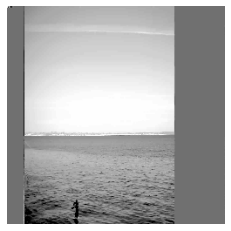

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


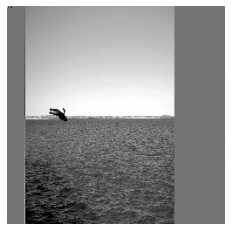

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


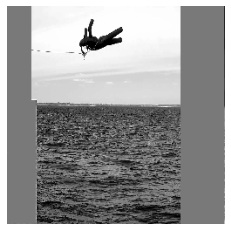

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


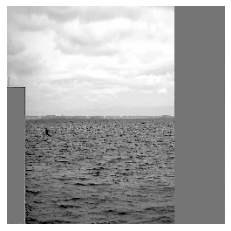

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


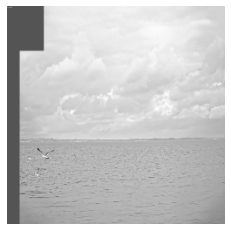

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


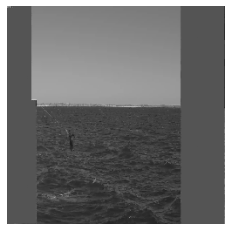

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


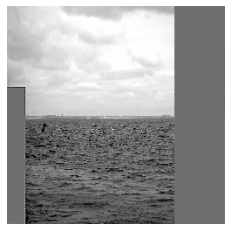

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


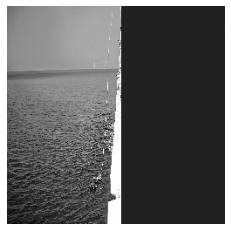

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


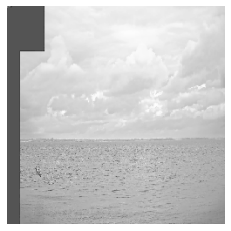

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


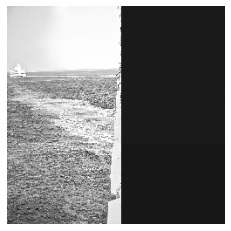

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


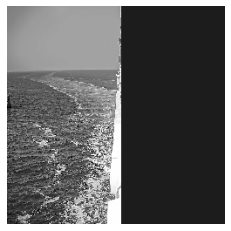

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


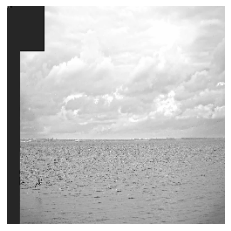

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


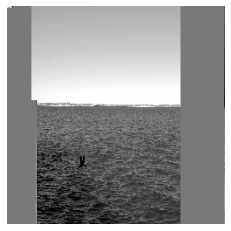

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


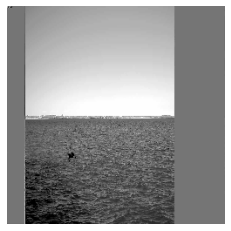

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


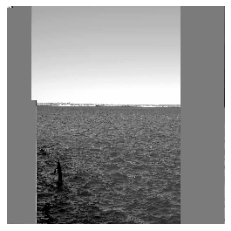

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


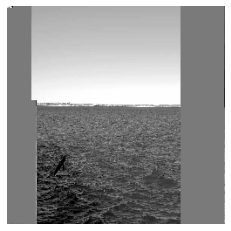

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


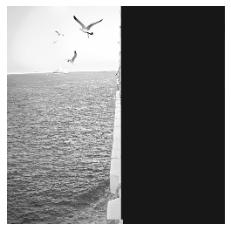

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


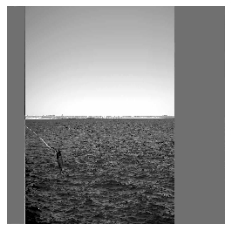

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


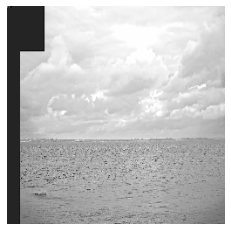

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


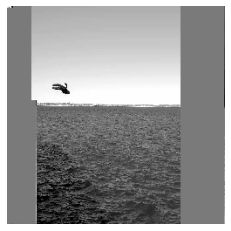

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


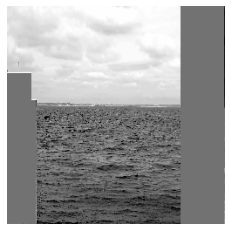

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


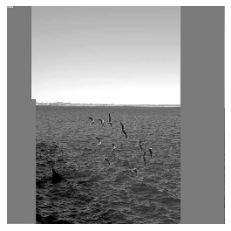

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


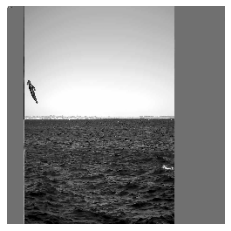

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


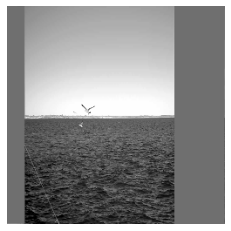

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


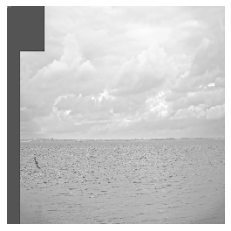

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


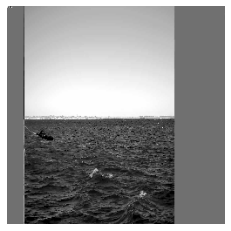

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


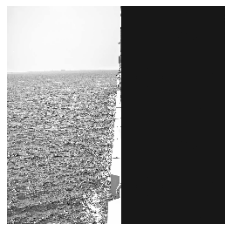

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


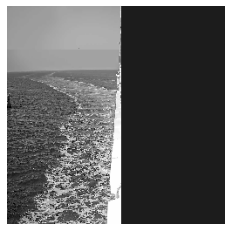

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


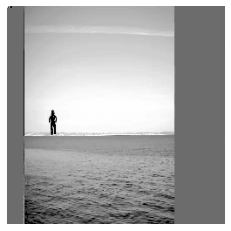

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


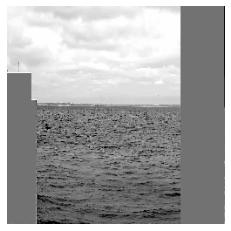

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


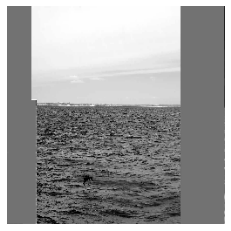

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


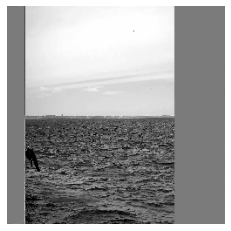

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


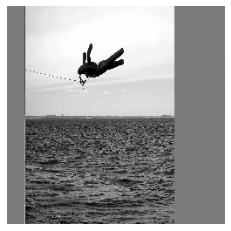

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


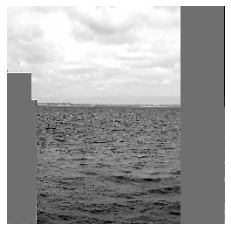

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


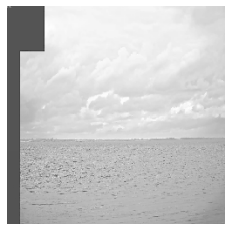

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


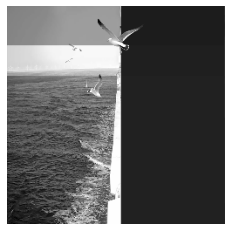

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


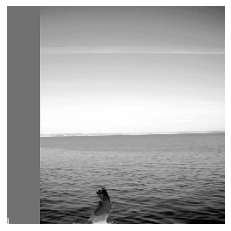

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


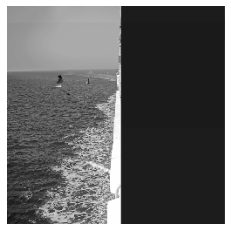

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


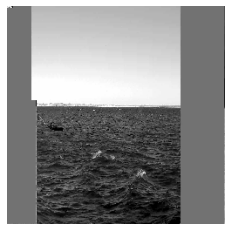

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]
Confusion Matrix (absolute)
 [[578  31]
 [ 16 593]]
Confusion Matrix (normalized)
 [[0.95 0.05]
 [0.03 0.97]]
Precision =  0.97 %
Recall =  0.95 %
F1 Score =  0.96 %


 Probability to detect a MOB: 0.95 %

 Probability of a false alarm: 0.03 %


In [ ]:
#classweight model
Evaluation(validation_generator, 25, show = True)

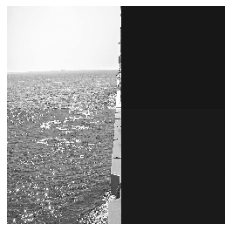

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


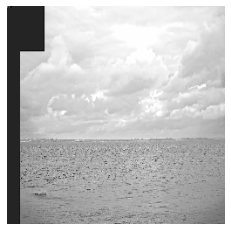

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


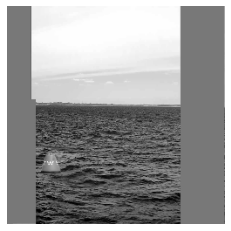

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


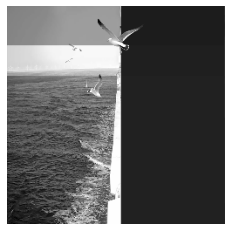

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


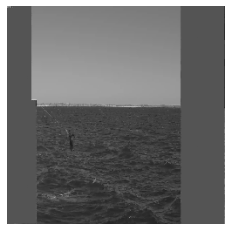

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


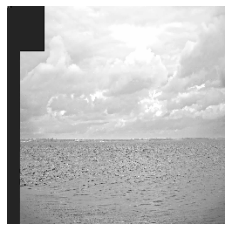

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


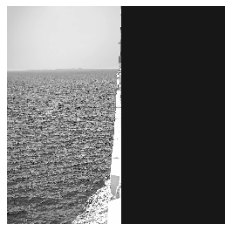

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


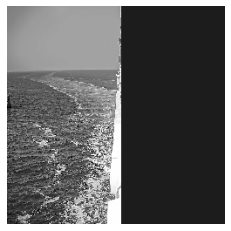

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


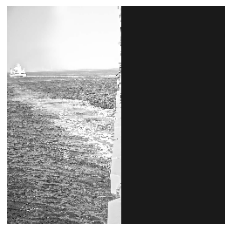

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


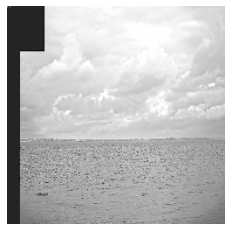

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


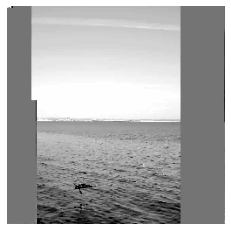

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


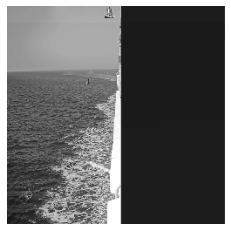

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


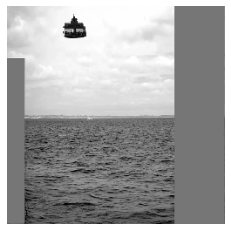

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


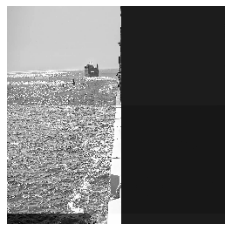

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


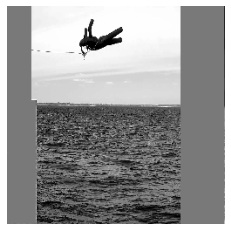

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


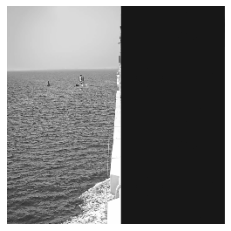

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


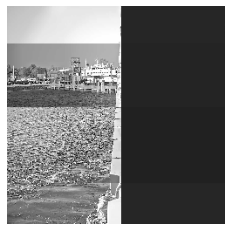

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


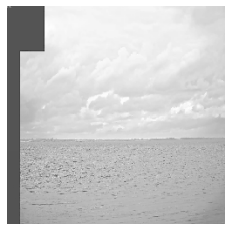

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


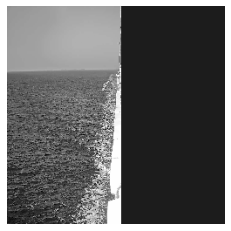

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


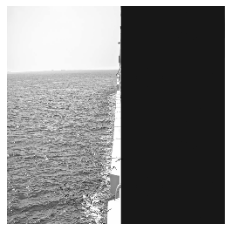

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


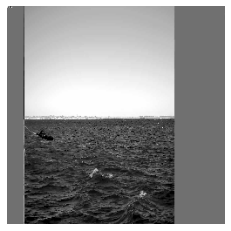

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


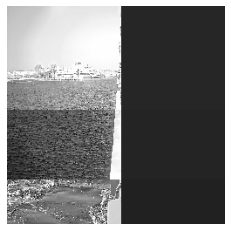

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


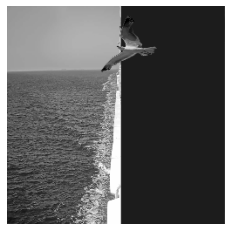

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


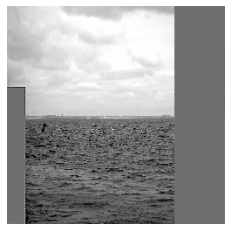

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


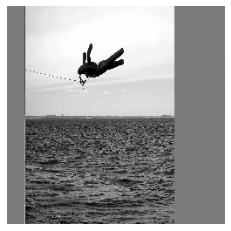

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


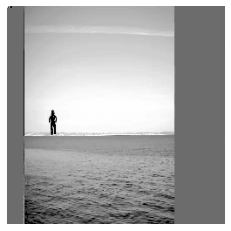

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


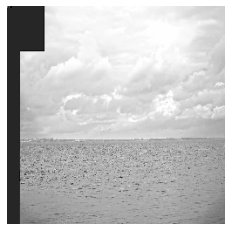

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


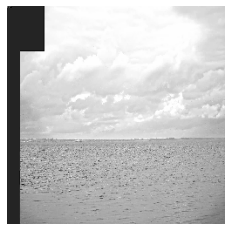

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


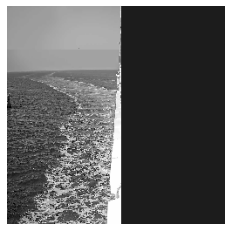

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


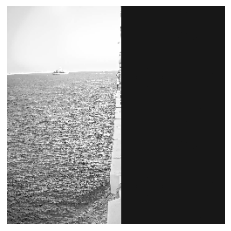

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


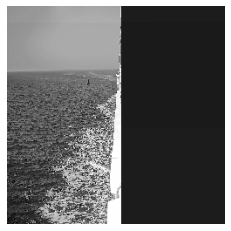

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


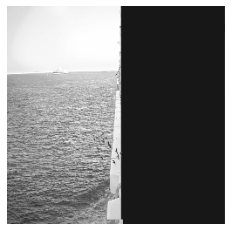

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


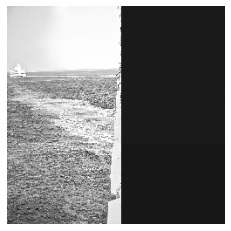

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


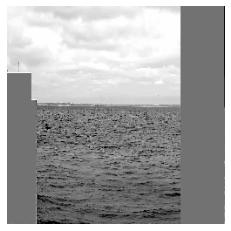

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


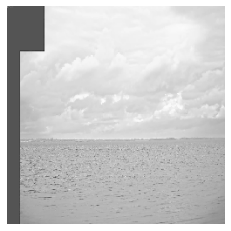

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


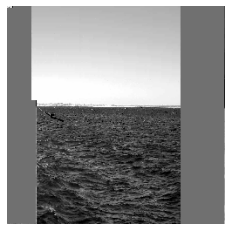

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


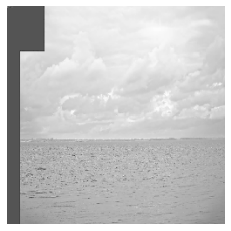

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


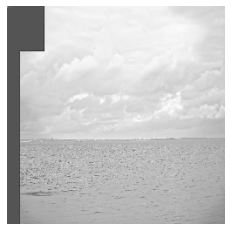

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


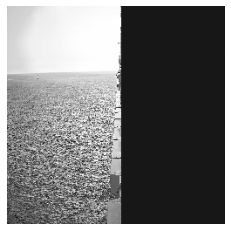

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


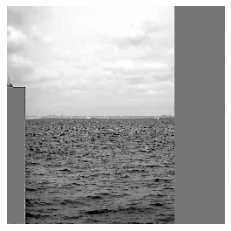

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


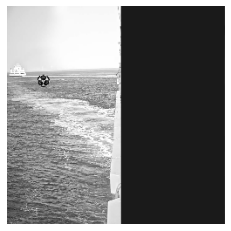

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


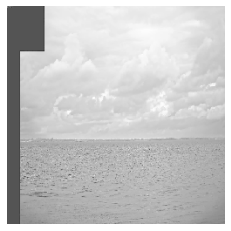

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


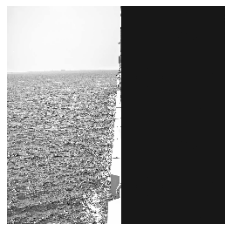

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


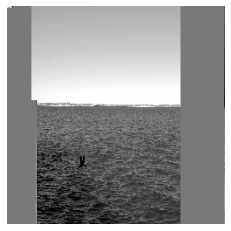

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


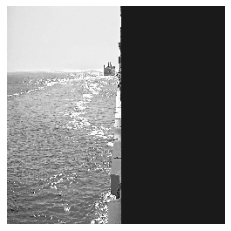

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


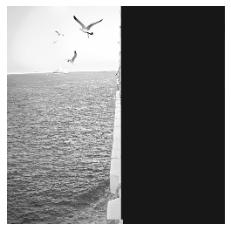

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


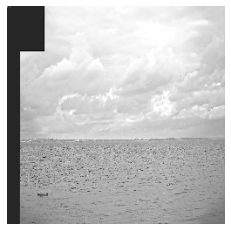

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


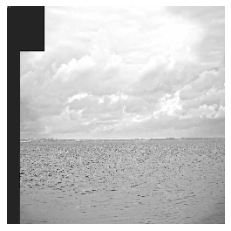

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


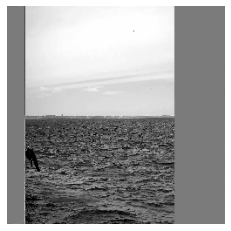

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


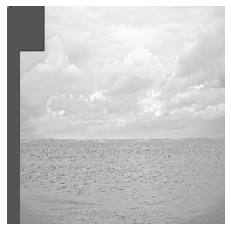

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


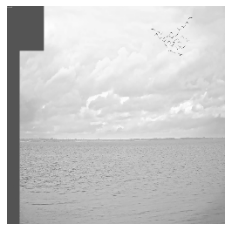

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


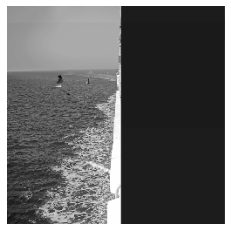

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


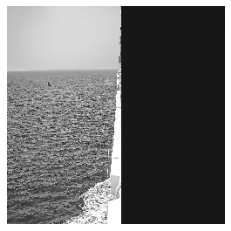

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


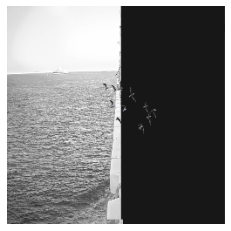

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


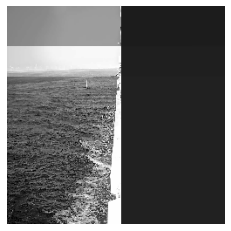

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


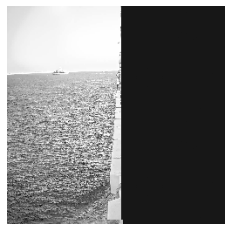

Label: no_MOB, Prediction: MOB, Predicted probability of no_MOB: [0.]


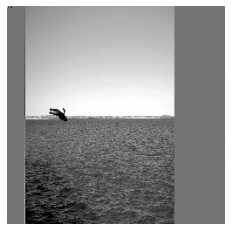

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


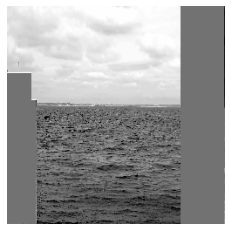

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


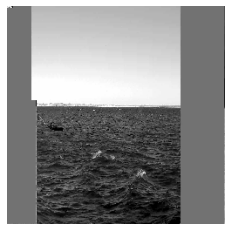

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]


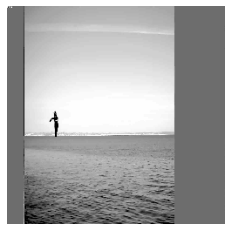

Label: MOB, Prediction: no_MOB, Predicted probability of no_MOB: [1.]
Confusion Matrix (absolute)
 [[594  15]
 [ 45 564]]
Confusion Matrix (normalized)
 [[0.98 0.02]
 [0.07 0.93]]
Precision =  0.93 %
Recall =  0.97 %
F1 Score =  0.95 %


 Probability to detect a MOB: 0.97 %

 Probability of a false alarm: 0.07 %


In [ ]:
Evaluation(validation_generator, 25, show = True)

### Change the Threshold

*   When the model is unsure about the class, it shall predict an alarm
*   Probability to detect a MOB is rising, while accepting a higher probability of false alarms

In [ ]:
Evaluation(validation_generator, 25, 0.7)

Confusion Matrix (absolute)
 [[595  14]
 [ 38 571]]
Confusion Matrix (normalized)
 [[0.98 0.02]
 [0.06 0.94]]
Precision =  0.94 %
Recall =  0.98 %
F1 Score =  0.96 %


 Probability to detect a MOB: 0.98 %

 Probability of a false alarm: 0.06 %


## Test Pictures

*   Training and validation data class MOB is based always on the same puppet
  *   Choose falling persons and paste them into a background to test the net

*   Training and validation pictures have always a similar background
  *   Choose differnet backgrounds to test the net

**weighted classes model**

weighted classes model


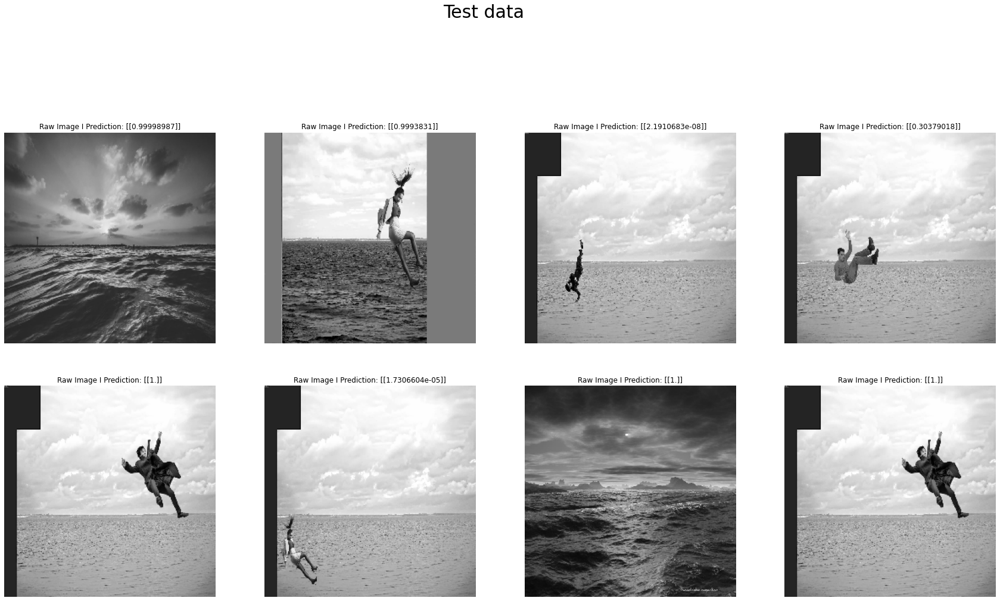

In [ ]:
print("weighted classes model")
predict_images(8, img_size, True, True, True)

**CNN**

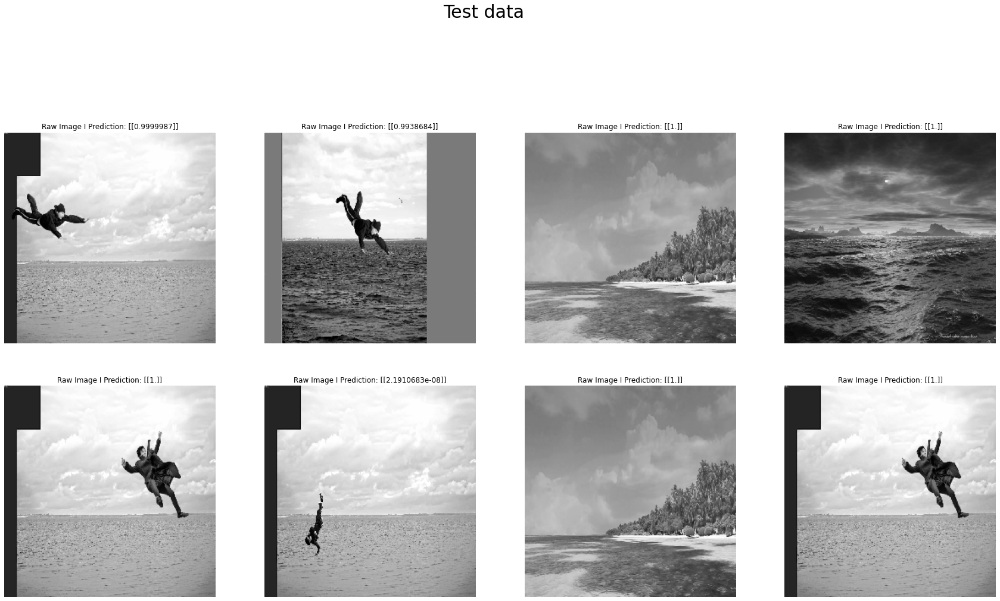

In [ ]:
def load_model(path):
  model = tf.keras.models.load_model('/content/gdrive/MyDrive/final_models/test/'+ path)
  return model

model_path = ['CNN_3C_BC_A_40E_IG_GradCAM(27,27).h5',]
predict_images(8, img_size, True, True, True)

# Conclusion


*   Satisfying first results
*   The model cannot generalize good enough


### Next Steps


*   Generate training pictures for class MOB
*   Generate more training pictures for both classes with unseen backgrounds
*   Apply the net in video data
*   Prepare the net for the use on an embedded device






